# Data Cleaning

In [1]:
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
df=pd.read_csv("cardio_train.csv",sep=';')

In [3]:
# Cheking for null or Na values in rows -> The dataset does not need to be cleaned from NAs or null values
df.isnull().any()

id             False
age            False
gender         False
height         False
weight         False
ap_hi          False
ap_lo          False
cholesterol    False
gluc           False
smoke          False
alco           False
active         False
cardio         False
dtype: bool

In [4]:
# Analyzing the dataset to find mistakes to clean up
df.describe().transpose()
#Mistakes found:
#1. Negative "ap_hi" and "ap_hi" and values greater than 370/360
#2. "ap_lo" > "ap_hi" -> diastolic pressure cannot be higher than systolic pressure

,count,mean,std,min,25%,50%,75%,max
id,70000.0,49972.419900,28851.302323,0.0,25006.75,50001.5,74889.25,99999.0
age,70000.0,19468.865814,2467.251667,10798.0,17664.00,19703.0,21327.00,23713.0
gender,70000.0,1.349571,0.476838,1.0,1.00,1.0,2.00,2.0
height,70000.0,164.359229,8.210126,55.0,159.00,165.0,170.00,250.0
weight,70000.0,74.205690,14.395757,10.0,65.00,72.0,82.00,200.0
ap_hi,70000.0,128.817286,154.011419,-150.0,120.00,120.0,140.00,16020.0
ap_lo,70000.0,96.630414,188.472530,-70.0,80.00,80.0,90.00,11000.0
cholesterol,70000.0,1.366871,0.680250,1.0,1.00,1.0,2.00,3.0
gluc,70000.0,1.226457,0.572270,1.0,1.00,1.0,1.00,3.0
smoke,70000.0,0.088129,0.283484,0.0,0.00,0.0,0.00,1.0


In [5]:
#Filtering all "ap_hi" >= 371 to know how many rows we are dropping
df_filtered1 = df[df['ap_hi'] >= 371]

In [6]:
df_filtered1.count()

id             39
age            39
gender         39
height         39
weight         39
ap_hi          39
ap_lo          39
cholesterol    39
gluc           39
smoke          39
alco           39
active         39
cardio         39
dtype: int64

In [7]:
# Dropping Systolic Blood Pressure above inclusive 371 as highest BP recorded is 370/360. Clearly the values are not recorded properly since greater than 300 is already a hypertensive crisis 
drop1 = df.drop(df[df["ap_hi"] >=371].index, inplace = True)

In [8]:
df.count()

id             69961
age            69961
gender         69961
height         69961
weight         69961
ap_hi          69961
ap_lo          69961
cholesterol    69961
gluc           69961
smoke          69961
alco           69961
active         69961
cardio         69961
dtype: int64

In [9]:
#Filtering all "ap_lo" >= 361 inclusive to know how many rows we are dropping
df_filtered2 = df[df['ap_lo'] >= 400]

In [10]:
df_filtered2.count()

id             953
age            953
gender         953
height         953
weight         953
ap_hi          953
ap_lo          953
cholesterol    953
gluc           953
smoke          953
alco           953
active         953
cardio         953
dtype: int64

In [11]:
# Dropping diastolic Blood Pressure above inclusive 361 as highest BP recorded is 370/360. Clearly the values are not recorded properly since greater than 300 is already a hypertensive crisis 
drop1 = df.drop(df[df["ap_lo"] >=361].index, inplace = True)

In [12]:
df.count()

id             69008
age            69008
gender         69008
height         69008
weight         69008
ap_hi          69008
ap_lo          69008
cholesterol    69008
gluc           69008
smoke          69008
alco           69008
active         69008
cardio         69008
dtype: int64

In [13]:
# Filter negative "ap_hi" to understand how many rows we need to drop
df_filtered3 = df[df['ap_hi'] <= 0]

In [14]:
df_filtered3.count()

id             7
age            7
gender         7
height         7
weight         7
ap_hi          7
ap_lo          7
cholesterol    7
gluc           7
smoke          7
alco           7
active         7
cardio         7
dtype: int64

In [15]:
# Dropping Negative Systolic Blood Pressure 
drop3 = df.drop(df[df["ap_hi"] <= 0].index, inplace = True)

In [16]:
df.count()

id             69001
age            69001
gender         69001
height         69001
weight         69001
ap_hi          69001
ap_lo          69001
cholesterol    69001
gluc           69001
smoke          69001
alco           69001
active         69001
cardio         69001
dtype: int64

In [17]:
# Filter negative "ap_lo" to understand how many rows we need to drop
df_filtered4 = df[df['ap_lo'] <= 0]

In [18]:
df_filtered4.count()

id             16
age            16
gender         16
height         16
weight         16
ap_hi          16
ap_lo          16
cholesterol    16
gluc           16
smoke          16
alco           16
active         16
cardio         16
dtype: int64

In [19]:
# Dropping Negative Systolic Blood Pressure 
drop4 = df.drop(df[df["ap_lo"] <= 0].index, inplace = True)

In [20]:
df.count()

id             68985
age            68985
gender         68985
height         68985
weight         68985
ap_hi          68985
ap_lo          68985
cholesterol    68985
gluc           68985
smoke          68985
alco           68985
active         68985
cardio         68985
dtype: int64

In [21]:
# Filtering rows in which "ap_lo" > "ap_hi" (systolic blood pressure cannot be higher than diastolic blood pressure) to understand how many we need to drop
df_filtered5 = df[df['ap_lo'] > df["ap_hi"]]


In [22]:
df_filtered5.count()


id             274
age            274
gender         274
height         274
weight         274
ap_hi          274
ap_lo          274
cholesterol    274
gluc           274
smoke          274
alco           274
active         274
cardio         274
dtype: int64

In [23]:
# Dropping rows in which "ap_lo" > "ap_hi" (systolic blood pressure cannot be higher than diastolic blood pressure) 
drop5 = df.drop(df[df["ap_lo"] > df["ap_hi"]].index, inplace = True)

In [24]:
df.count()

id             68711
age            68711
gender         68711
height         68711
weight         68711
ap_hi          68711
ap_lo          68711
cholesterol    68711
gluc           68711
smoke          68711
alco           68711
active         68711
cardio         68711
dtype: int64

In [25]:
# Dropping ID column
df.drop(['id'],axis=1,inplace=True)

In [26]:
# Data Preparation
# Merge Weight and Height into 1 feature: BMI
df['BMI']=round(df['weight']/((df['height']/100)**2),2)

In [27]:
# Convert gender to English text
df['gender']=df['gender'].map({1:"woman", 2:"man"})

In [28]:
# Convert numeric values in cholesterol to English text
df['cholesterol']=df['cholesterol'].map({1:"Normal", 2:"Ab_Normal", 3:'High'})

In [29]:
# Convert numeric values for glucose to english text
df['gluc']=df['gluc'].map({1:"Normal", 2:"Ab_Normal", 3:'High'})

In [30]:
# Creating Dummy Variable for Cholesterol
d1=pd.get_dummies(df['cholesterol'],prefix='chol',drop_first=True)

In [31]:
# Creating Dummy Variable for Glucose
d2=pd.get_dummies(df['gluc'],prefix='gluc',drop_first=True)

In [32]:
#Create columns for dummies glucose / cholesterol high and normal
df=pd.concat([df,d1,d2],axis=1)
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,chol_High,chol_Normal,gluc_High,gluc_Normal
0,18393,man,168,62.0,110,80,Normal,Normal,0,0,1,0,21.97,0,1,0,1
1,20228,woman,156,85.0,140,90,High,Normal,0,0,1,1,34.93,1,0,0,1
2,18857,woman,165,64.0,130,70,High,Normal,0,0,0,1,23.51,1,0,0,1
3,17623,man,169,82.0,150,100,Normal,Normal,0,0,1,1,28.71,0,1,0,1
4,17474,woman,156,56.0,100,60,Normal,Normal,0,0,0,0,23.01,0,1,0,1


In [33]:
#Convert integer age to float
pd.to_numeric(df["age"], downcast="float")

0        18393.0
1        20228.0
2        18857.0
3        17623.0
4        17474.0
          ...   
69995    19240.0
69996    22601.0
69997    19066.0
69998    22431.0
69999    20540.0
Name: age, Length: 68711, dtype: float32

In [34]:
#Convert age in days to values in years
df["age"] = df['age']/365

In [35]:
df.rename(columns={'ap_hi':'systolic_BP', 'ap_lo':'diastolic_BP', 'alco':'Alcohol', 'active':'physical_activity', 'cardio':'cardio_disease'}, inplace=True)

In [36]:
# Create a function that indicates whether the patient has a healthy, elevated, or suffers hypertension based on their systolic and diastolic readings.

def bpfunction(systolic, diastolic):
    if systolic <= 120 and diastolic <= 80:
        return "healthy"
    elif systolic > 120 and systolic <= 129 and diastolic <= 80:
        return "elevated"
    else:
        return "hypertension" 

In [37]:
# Add a new column using the bpfunction
df['blood_pressure'] = df.apply(lambda x: bpfunction(x['systolic_BP'], x['diastolic_BP']), axis=1)

In [38]:
# Create a function that indicates whether the patient is underweight, normal, or overweight.
def bmifunction(weight):
    if weight < 18.5:
        return "underweight"
    elif weight >= 18.5 and weight <= 24.9:
        return "normal"
    else:
        return "overweight"       

In [39]:
df["BMI_result"] = df["BMI"].apply(bmifunction)

In [40]:
#Data Analysis and Stadistics
#Sample and Habits Analysis

In [41]:
# Calculate summary stadistics
df.describe()

,age,height,weight,systolic_BP,diastolic_BP,smoke,Alcohol,physical_activity,cardio_disease,BMI,chol_High,chol_Normal,gluc_High,gluc_Normal
count,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000,68711.000000
mean,53.326782,164.359666,74.117921,126.669296,81.273115,0.087919,0.053339,0.803379,0.494710,27.523184,0.114610,0.749967,0.075927,0.850301
std,6.762069,8.191164,14.333281,16.708332,9.572682,0.283179,0.224711,0.397446,0.499976,6.068787,0.318554,0.433035,0.264883,0.356779
min,29.583562,55.000000,11.000000,16.000000,1.000000,0.000000,0.000000,0.000000,0.000000,3.470000,0.000000,0.000000,0.000000,0.000000
25%,48.375342,159.000000,65.000000,120.000000,80.000000,0.000000,0.000000,1.000000,0.000000,23.880000,0.000000,0.000000,0.000000,1.000000
50%,53.975342,165.000000,72.000000,120.000000,80.000000,0.000000,0.000000,1.000000,0.000000,26.350000,0.000000,1.000000,0.000000,1.000000
75%,58.421918,170.000000,82.000000,140.000000,90.000000,0.000000,0.000000,1.000000,1.000000,30.120000,0.000000,1.000000,0.000000,1.000000
max,64.967123,250.000000,200.000000,240.000000,182.000000,1.000000,1.000000,1.000000,1.000000,298.670000,1.000000,1.000000,1.000000,1.000000


In [42]:
#Understand the sample of patients that provided information: gender, age, and predominant habits
# What are the average values by gender? 
df.groupby(by="gender")["age", "BMI", "height", "weight", "systolic_BP", "diastolic_BP"].mean()

,age,BMI,height,weight,systolic_BP,diastolic_BP
gender,,,,,,
man,53.111702,26.728852,169.939214,77.172400,128.087004,82.151463
woman,53.441886,27.948284,161.373676,72.483266,125.910586,80.803052


In [43]:
# How many female and male patients are in the clean dataset?
gender_tot = df.gender.value_counts()

In [44]:
# Conver gender count to a series 
sergender = pd.Series(gender_tot)

In [45]:
# How many male and female patients either have some physical activity, smoke, drink or suffer from a cardiac disease?
# Create a habits table based on gender
habits = df.groupby(by="gender")["physical_activity", "smoke", "Alcohol", "cardio_disease"].sum()

In [46]:
# Convert the habits table to a Dataframe
percent_habits = pd.DataFrame(habits) 

In [47]:
# add a the gender total series to the dataframe
percent_habits["total_gender"] = sergender 

In [48]:
percent_habits

,physical_activity,smoke,Alcohol,cardio_disease,total_gender
gender,,,,,
man,19320,5247,2537,11967,23953
woman,35881,794,1128,22025,44758


In [49]:
#Convert all columns to numeric int
pd.to_numeric(percent_habits["physical_activity"])

gender
man      19320
woman    35881
Name: physical_activity, dtype: int64

In [50]:
pd.to_numeric(percent_habits["smoke"])

gender
man      5247
woman     794
Name: smoke, dtype: int64

In [51]:
pd.to_numeric(percent_habits["Alcohol"])

gender
man      2537
woman    1128
Name: Alcohol, dtype: int64

In [52]:
pd.to_numeric(percent_habits["cardio_disease"])

gender
man      11967
woman    22025
Name: cardio_disease, dtype: int64

In [53]:
pd.to_numeric(percent_habits["total_gender"])

gender
man      23953
woman    44758
Name: total_gender, dtype: int64

In [54]:
# Add all percentage columns to the percent_habits df
percent_habits["% of Physical Activity"] = (percent_habits['physical_activity'] / percent_habits['total_gender'])*100

In [55]:
percent_habits["% of smokers"] = (percent_habits['smoke'] / percent_habits['total_gender'])*100

In [56]:
percent_habits["% of drinkers"] = (percent_habits['Alcohol'] / percent_habits['total_gender'])*100

In [57]:
percent_habits["% cardiac disease"] = (percent_habits['cardio_disease'] / percent_habits['total_gender'])*100

In [58]:
# Check percent habits -> Analysis portion to undertand habits of the sample
# There is no difference in gender for physical activity (80% of male and females have some PA)
# However bad habits such as smoking (22% males but only 1% females) and drinking (10% males but only 2.5% females) are more predominat in males
# Even though males have more predominant bad habits, there is no difference in terms of cardiac dissease since almost the same percentage affect both genders 
percent_habits

,physical_activity,smoke,Alcohol,cardio_disease,total_gender,% of Physical Activity,% of smokers,% of drinkers,% cardiac disease
gender,,,,,,,,,
man,19320,5247,2537,11967,23953,80.657955,21.905398,10.591575,49.960339
woman,35881,794,1128,22025,44758,80.166674,1.773985,2.520220,49.209080


In [59]:
#Health Conditions Analysis

In [60]:
# Does smoking affect glucose?
df.groupby(["gender", "gluc"])["smoke"].sum()

gender  gluc     
man     Ab_Normal     438
        High          319
        Normal       4490
woman   Ab_Normal      88
        High           67
        Normal        639
Name: smoke, dtype: int64

In [61]:
# Does smoking affect cholesterol?
df.groupby(["gender", "cholesterol"])["smoke"].sum()

gender  cholesterol
man     Ab_Normal       833
        High            551
        Normal         3863
woman   Ab_Normal       151
        High            123
        Normal          520
Name: smoke, dtype: int64

In [62]:
# Does drinking affect glucose?
df.groupby(["gender", "gluc"])["Alcohol"].sum()

gender  gluc     
man     Ab_Normal     251
        High          167
        Normal       2119
woman   Ab_Normal     143
        High           95
        Normal        890
Name: Alcohol, dtype: int64

In [63]:
# Does drinking affect cholesterol?
df.groupby(["gender", "cholesterol"])["Alcohol"].sum()

gender  cholesterol
man     Ab_Normal       457
        High            298
        Normal         1782
woman   Ab_Normal       244
        High            203
        Normal          681
Name: Alcohol, dtype: int64

In [64]:
# Does smoking lead to cardiac disease?
df.groupby(["cardio_disease"])["smoke"].sum()

cardio_disease
0    3211
1    2830
Name: smoke, dtype: int64

In [65]:
# Does drinking lead to cardiac disease?
df.groupby(["cardio_disease"])["Alcohol"].sum()

cardio_disease
0    1919
1    1746
Name: Alcohol, dtype: int64

In [66]:
# Does cholesterol make you prone to cardiac disease?
# Do people with cholesterol suffer from cardiac disease?
df.groupby(["gender", "cholesterol"])["cardio_disease"].sum()

gender  cholesterol
man     Ab_Normal       1922
        High            1829
        Normal          8216
woman   Ab_Normal       3627
        High            4177
        Normal         14221
Name: cardio_disease, dtype: int64

In [67]:
# Do people with physical activity have lower cholesterol?
df.groupby(["gender", "cholesterol"])["physical_activity"].sum()

gender  cholesterol
man     Ab_Normal       2460
        High            2021
        Normal         14839
woman   Ab_Normal       4963
        High            4412
        Normal         26506
Name: physical_activity, dtype: int64

In [68]:
# Do people with physical activity tend to be less prone to cardiac disease?
df.groupby(["cardio_disease"])["physical_activity"].sum()

cardio_disease
0    28403
1    26798
Name: physical_activity, dtype: int64

In [69]:
# Do people with cardiac disease work out?
df.groupby(["physical_activity"])["cardio_disease"].sum()

physical_activity
0     7194
1    26798
Name: cardio_disease, dtype: int64

In [70]:
# Do overweight people suffer from cardio dissease?
df.groupby(["BMI_result"])["cardio_disease"].sum()

BMI_result
normal          9654
overweight     24161
underweight      177
Name: cardio_disease, dtype: int64

In [71]:
# Overweight people suffering from cardio dissease by gender
df.groupby(["gender", "BMI_result"])["cardio_disease"].sum()

gender  BMI_result 
man     normal          3671
        overweight      8234
        underweight       62
woman   normal          5983
        overweight     15927
        underweight      115
Name: cardio_disease, dtype: int64

In [72]:
# Do people with high blood pressure suffer from cardiac disease?
df.groupby(["blood_pressure"])["cardio_disease"].sum()

blood_pressure
elevated          149
healthy         12198
hypertension    21645
Name: cardio_disease, dtype: int64

In [73]:
#  Look for blood pressure people by gender
df.groupby(["gender", "blood_pressure"])["cardio_disease"].sum()

gender  blood_pressure
man     elevated             40
        healthy            4058
        hypertension       7869
woman   elevated            109
        healthy            8140
        hypertension      13776
Name: cardio_disease, dtype: int64

In [74]:
#Run correlation analysis 
correlation_df = df.corr()

In [75]:
correlation_df

,age,height,weight,systolic_BP,diastolic_BP,smoke,Alcohol,physical_activity,cardio_disease,BMI,chol_High,chol_Normal,gluc_High,gluc_Normal
age,1.000000,-0.081123,0.054864,0.209283,0.155544,-0.047647,-0.028814,-0.010174,0.239270,0.086151,0.153675,-0.130516,0.094285,-0.088289
height,-0.081123,1.000000,0.291365,0.018619,0.037096,0.188102,0.094463,-0.007519,-0.010554,-0.290083,-0.040970,0.049258,-0.013794,0.019549
weight,0.054864,0.291365,1.000000,0.270643,0.251197,0.067027,0.067419,-0.017743,0.179683,0.761786,0.114269,-0.137140,0.068702,-0.120396
systolic_BP,0.209283,0.018619,0.270643,1.000000,0.726519,0.027803,0.035333,-0.001203,0.427451,0.232105,0.154093,-0.192087,0.064129,-0.103433
diastolic_BP,0.155544,0.037096,0.251197,0.726519,1.000000,0.025959,0.037212,-0.000984,0.335926,0.205284,0.129890,-0.154302,0.050034,-0.082908
smoke,-0.047647,0.188102,0.067027,0.027803,0.025959,1.000000,0.340506,0.025317,-0.016297,-0.027866,-0.002962,-0.017512,-0.014101,-0.001104
Alcohol,-0.028814,0.094463,0.067419,0.035333,0.037212,0.340506,1.000000,0.024544,-0.008694,0.014565,0.016459,-0.042721,-0.003979,-0.019488
physical_activity,-0.010174,-0.007519,-0.017743,-0.001203,-0.000984,0.025317,0.024544,1.000000,-0.037387,-0.014113,0.012230,-0.004562,-0.003073,0.010424
cardio_disease,0.239270,-0.010554,0.179683,0.427451,0.335926,-0.016297,-0.008694,-0.037387,1.000000,0.163576,0.192825,-0.205421,0.070454,-0.091169
BMI,0.086151,-0.290083,0.761786,0.232105,0.205284,-0.027866,0.014565,-0.014113,0.163576,1.000000,0.119801,-0.140606,0.066571,-0.113103


# Database Export

In [76]:
import sqlite3

# create and open database connection
conn = sqlite3.connect('cardio_clean_export.db')

print("Opened database successfully!");

Opened database successfully!


In [77]:
# cursor object for sql execution
cursor = conn.cursor()

# create table statement
sql ='''CREATE TABLE cardio_data(
   [index] int,
   age float,
   gender char(10),
   height int,
   weight int,
   systolic_BP int,
   diastolic_BP int,
   cholesterol char(15),
   gluc char(15),
   smoke int,
   Alcohol int,
   physical_activity int,
   cardio_disease int,
   BMI float,
   chol_High int,
   chol_Normal int,
   gluc_High int,
   gluc_Normal int,
   blood_pressure char(20),
   BMI_result char(20)
)'''

# execute create table query
cursor.execute(sql)
print("Table created successfully!")

# commit changes in the database
conn.commit()

OperationalError: table cardio_data already exists

In [ ]:
# creates table (cardio_train) and inserts dataframe to table
df.to_sql(name='cardio_data', con=conn, if_exists='append')

In [78]:
# creates cursor for data selection
cur = conn.cursor()
# sample select query to verify table and data
cur.execute("SELECT * FROM cardio_data")
# cursor result set to rows variable
rows = cur.fetchall()
# loop through the result set and print row
for row in rows:
  print(row)

# close database connection
conn.close()

(0, 50.391780821917806, 'man', 168, 62, 110, 80, 'Normal', 'Normal', 0, 0, 1, 0, 21.97, 0, 1, 0, 1, 'healthy', 'normal')
(1, 55.41917808219178, 'woman', 156, 85, 140, 90, 'High', 'Normal', 0, 0, 1, 1, 34.93, 1, 0, 0, 1, 'hypertension', 'overweight')
(2, 51.66301369863014, 'woman', 165, 64, 130, 70, 'High', 'Normal', 0, 0, 0, 1, 23.51, 1, 0, 0, 1, 'hypertension', 'normal')
(3, 48.28219178082192, 'man', 169, 82, 150, 100, 'Normal', 'Normal', 0, 0, 1, 1, 28.71, 0, 1, 0, 1, 'hypertension', 'overweight')
(4, 47.87397260273973, 'woman', 156, 56, 100, 60, 'Normal', 'Normal', 0, 0, 0, 0, 23.01, 0, 1, 0, 1, 'healthy', 'normal')
(5, 60.038356164383565, 'woman', 151, 67, 120, 80, 'Ab_Normal', 'Ab_Normal', 0, 0, 0, 0, 29.38, 0, 0, 0, 0, 'healthy', 'overweight')
(6, 60.583561643835615, 'woman', 157, 93, 130, 80, 'High', 'Normal', 0, 0, 1, 0, 37.73, 1, 0, 0, 1, 'hypertension', 'overweight')
(7, 61.87397260273973, 'man', 178, 95, 130, 90, 'High', 'High', 0, 0, 1, 1, 29.98, 1, 0, 1, 0, 'hypertension',

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



(33152, 56.397260273972606, 'man', 168, 75, 140, 100, 'Normal', 'Normal', 0, 0, 1, 1, 26.57, 0, 1, 0, 1, 'hypertension', 'overweight')
(33153, 49.895890410958906, 'woman', 157, 72, 130, 90, 'Normal', 'Normal', 0, 0, 1, 1, 29.21, 0, 1, 0, 1, 'hypertension', 'overweight')
(33154, 53.73698630136986, 'woman', 149, 70, 120, 70, 'Ab_Normal', 'Normal', 0, 0, 1, 1, 31.53, 0, 0, 0, 1, 'healthy', 'overweight')
(33155, 49.93150684931507, 'woman', 158, 74, 120, 80, 'Normal', 'Normal', 0, 0, 1, 0, 29.64, 0, 1, 0, 1, 'healthy', 'overweight')
(33156, 39.88219178082192, 'woman', 164, 58, 110, 70, 'Normal', 'Normal', 0, 0, 1, 0, 21.56, 0, 1, 0, 1, 'healthy', 'normal')
(33157, 42.6958904109589, 'woman', 150, 69, 110, 70, 'Normal', 'Normal', 0, 0, 1, 0, 30.67, 0, 1, 0, 1, 'healthy', 'overweight')
(33158, 45.64383561643836, 'man', 170, 72, 120, 80, 'Normal', 'Normal', 0, 0, 1, 0, 24.91, 0, 1, 0, 1, 'healthy', 'overweight')
(33159, 40.26027397260274, 'woman', 168, 86, 110, 80, 'Ab_Normal', 'Normal', 0, 0, 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




(67964, 57.62465753424657, 'woman', 170, 65, 120, 80, 'Normal', 'Normal', 0, 0, 1, 1, 22.49, 0, 1, 0, 1, 'healthy', 'normal')
(67965, 48.679452054794524, 'woman', 164, 57, 110, 80, 'Normal', 'Normal', 0, 0, 0, 1, 21.19, 0, 1, 0, 1, 'healthy', 'normal')
(67966, 57.78630136986301, 'man', 165, 75, 140, 90, 'High', 'High', 1, 0, 1, 0, 27.55, 1, 0, 1, 0, 'hypertension', 'overweight')
(67967, 58.58082191780822, 'man', 180, 81, 120, 80, 'Normal', 'Normal', 0, 0, 1, 0, 25.0, 0, 1, 0, 1, 'healthy', 'overweight')
(67968, 58.64657534246575, 'woman', 156, 64, 160, 100, 'Ab_Normal', 'Normal', 0, 0, 1, 1, 26.3, 0, 0, 0, 1, 'hypertension', 'overweight')
(67969, 62.25753424657534, 'man', 173, 73, 130, 80, 'Ab_Normal', 'Normal', 0, 0, 1, 1, 24.39, 0, 0, 0, 1, 'hypertension', 'normal')
(67970, 54.723287671232875, 'man', 158, 70, 110, 80, 'Normal', 'Normal', 0, 0, 1, 1, 28.04, 0, 1, 0, 1, 'healthy', 'overweight')
(67971, 43.94794520547945, 'woman', 156, 58, 110, 70, 'Normal', 'Normal', 0, 0, 1, 1, 23.83

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




(33498, 54.28767123287671, 'woman', 170, 75, 120, 80, 'Normal', 'Normal', 0, 0, 1, 0, 25.95, 0, 1, 0, 1, 'healthy', 'overweight')
(33499, 60.134246575342466, 'woman', 160, 78, 120, 70, 'Normal', 'Normal', 0, 0, 0, 1, 30.47, 0, 1, 0, 1, 'healthy', 'overweight')
(33500, 50.29041095890411, 'woman', 168, 78, 130, 80, 'Normal', 'Normal', 0, 0, 1, 0, 27.64, 0, 1, 0, 1, 'hypertension', 'overweight')
(33501, 55.81369863013698, 'woman', 158, 62, 110, 60, 'Normal', 'Normal', 0, 0, 1, 0, 24.84, 0, 1, 0, 1, 'healthy', 'normal')
(33502, 60.0958904109589, 'woman', 169, 105, 140, 100, 'Ab_Normal', 'Normal', 0, 0, 1, 1, 36.76, 0, 0, 0, 1, 'hypertension', 'overweight')
(33503, 52.087671232876716, 'woman', 154, 106, 120, 80, 'Normal', 'Normal', 1, 0, 1, 0, 44.7, 0, 1, 0, 1, 'healthy', 'overweight')
(33504, 52.824657534246576, 'man', 187, 89, 120, 70, 'Normal', 'Normal', 0, 0, 0, 1, 25.45, 0, 1, 0, 1, 'healthy', 'overweight')
(33505, 53.273972602739725, 'woman', 167, 62, 130, 80, 'Normal', 'Normal', 0, 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



(68800, 61.99452054794521, 'woman', 155, 85, 110, 70, 'Normal', 'Normal', 0, 0, 1, 0, 35.38, 0, 1, 0, 1, 'healthy', 'overweight')
(68801, 46.013698630136986, 'man', 169, 67, 120, 80, 'Normal', 'Normal', 0, 0, 0, 0, 23.46, 0, 1, 0, 1, 'healthy', 'normal')
(68802, 53.97260273972603, 'woman', 164, 54, 120, 80, 'Normal', 'Normal', 0, 0, 1, 0, 20.08, 0, 1, 0, 1, 'healthy', 'normal')
(68803, 55.967123287671235, 'woman', 175, 70, 120, 80, 'Normal', 'Normal', 0, 0, 1, 0, 22.86, 0, 1, 0, 1, 'healthy', 'normal')
(68804, 59.74246575342466, 'woman', 143, 56, 140, 80, 'Normal', 'Normal', 0, 0, 1, 0, 27.39, 0, 1, 0, 1, 'hypertension', 'overweight')
(68805, 48.136986301369866, 'woman', 154, 83, 170, 100, 'Normal', 'Normal', 0, 0, 0, 1, 35.0, 0, 1, 0, 1, 'hypertension', 'overweight')
(68806, 46.11232876712329, 'woman', 166, 91, 130, 80, 'High', 'Normal', 0, 1, 1, 0, 33.02, 1, 0, 0, 1, 'hypertension', 'overweight')
(68807, 51.59178082191781, 'woman', 168, 90, 140, 100, 'Normal', 'Normal', 0, 0, 1, 1, 3

## Distribution Plot
### (Distribution for one variable)

<AxesSubplot:xlabel='age'>

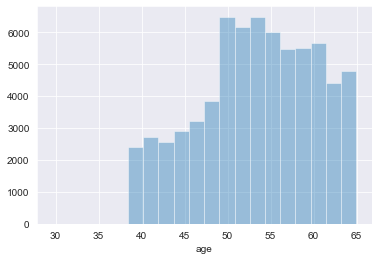

In [79]:
sns.set_style("darkgrid")
sns.distplot(df["age"], kde=False, bins=20)
#you can turn on kde line by switching to True
#Finding was that most of the participants fall within the 50-55 Age bins

## Joint Plot
### (compares two distributions, plots a scatterplot by default)

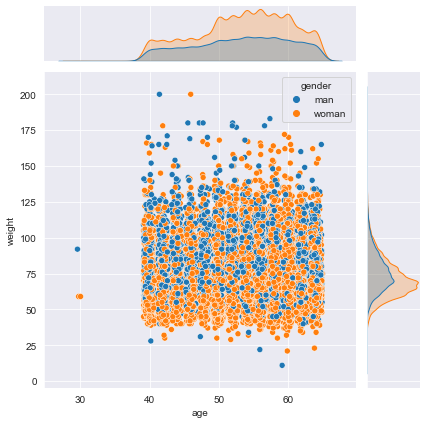

In [80]:
sns.jointplot(x="age", y="weight", hue="gender", data=df)
#This visualization shows us that the majority of males and females weights 
#fall just under 75 kg or 165 pounds

## Hex Plot

<Figure size 720x720 with 0 Axes>

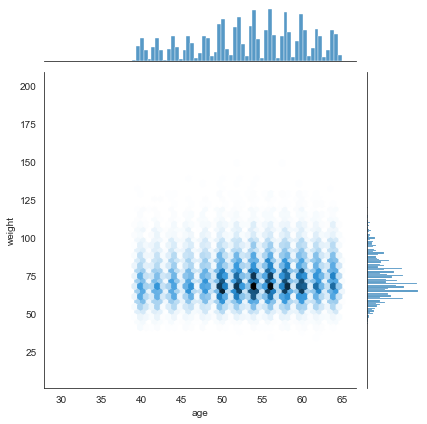

In [81]:
plt.figure(figsize=(10,10))
sns.set_style("white")
sns.jointplot(x="age", y="weight", data=df, kind="hex")

## KDE Plot
### (kernel density estimate plot)

<AxesSubplot:xlabel='age', ylabel='Density'>

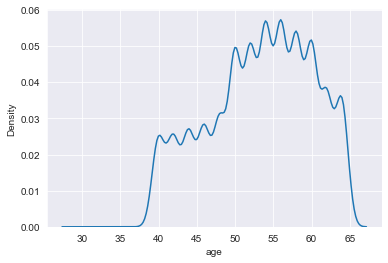

In [82]:
sns.set_style("darkgrid")
sns.kdeplot(df["age"])
#This visualization is another way of visualizing the distribution of age

# Categorical Plots

## Bar Plot

<AxesSubplot:xlabel='gender', ylabel='BMI'>

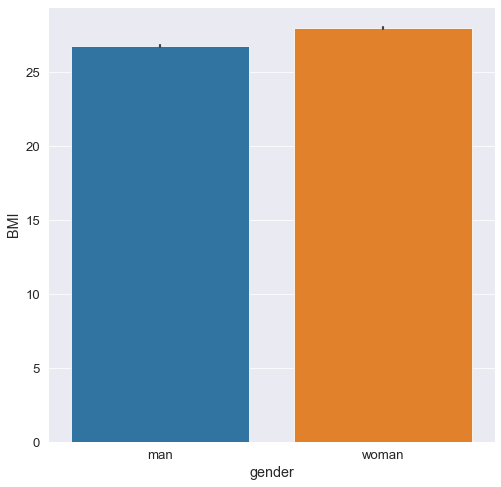

In [85]:
plt.figure(figsize=(8,8))
#this adjusts the size of the entire plot

sns.barplot(x="gender", y="BMI", data=df)
#This visualization shows us BMI by gender

## Count Plot
### (counts the number of occurrences)

<AxesSubplot:xlabel='gender', ylabel='count'>

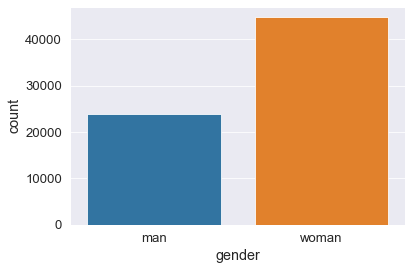

In [86]:
sns.countplot(x="gender", data=df)
#This visualization shows us the total count of each gender in the dataset

## Box Plot
### (Shows the quartiles of the data selected. For example: the bar in the middle is the median)

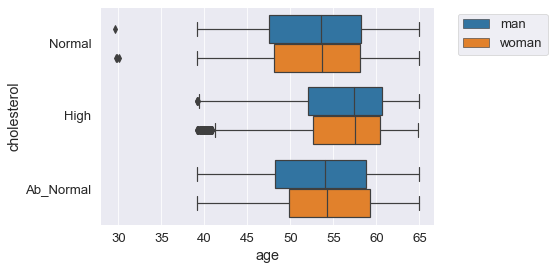

In [87]:
sns.boxplot(x="age", y="cholesterol", data=df, hue="gender")
plt.legend(bbox_to_anchor=(1.05,1))
#code above puts the legend outside of the plot
#This visualization shows us that "high" cholestorol is more common the older a person's age, 
#but the "normal" and "ab normal" median fall right under 54 years old.

## Violin Plot

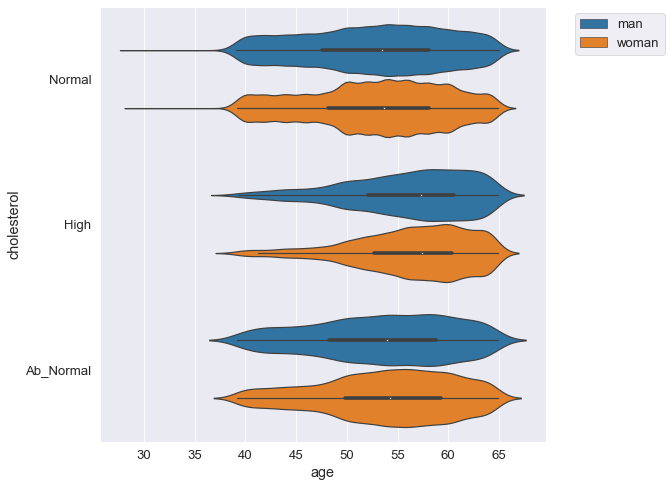

In [88]:
plt.figure(figsize=(8,8))
sns.set_style("darkgrid")
sns.violinplot(x="age", y="cholesterol", data=df, hue="gender")
plt.legend(bbox_to_anchor=(1.05,1))
#This visualization is similar to the box plot, but it helps shows where the majority lies by analyzing 
#the thickness of the violin. This plot also shows there are more outliers in "normal cholesterol" in
#younger individuals, 35 and below, when compared to "high" and "abnormal" cholesterol levels

## Strip Plot

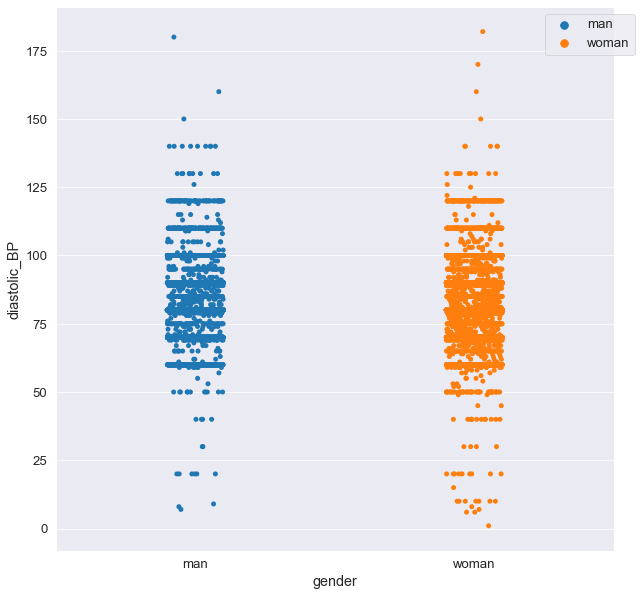

In [89]:
plt.figure(figsize=(10,10))
sns.stripplot(x="gender", y="diastolic_BP", data=df, hue="gender")
plt.legend(bbox_to_anchor=(1.05,1))
#This visualization shows the diastolic BP levels of males and females
#this helps show that a majority of diastolic BP levels fall within the 75-90 range and that women appear
#to have slightly lower diastolic BP levels when compared to men.

## Matrix Plots

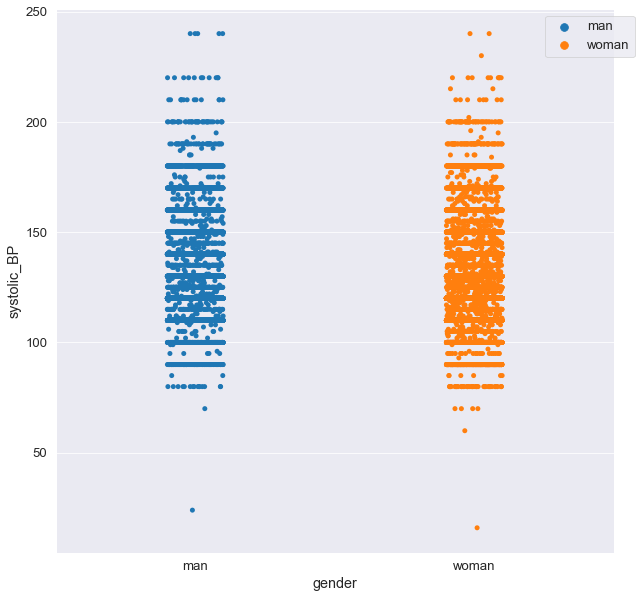

In [90]:
plt.figure(figsize=(10,10))
sns.stripplot(x="gender", y="systolic_BP", data=df, hue="gender")
plt.legend(bbox_to_anchor=(1.05,1))
#This visualization shows the systolic BP levels of males and females
#this helps show that a majority of systolic BP levels fall within the 100-140 range and that women appear
#to have slightly lower systolic BP levels when compared to men.

### Heatmap
#### (Correlation Heatmap)

<AxesSubplot:>

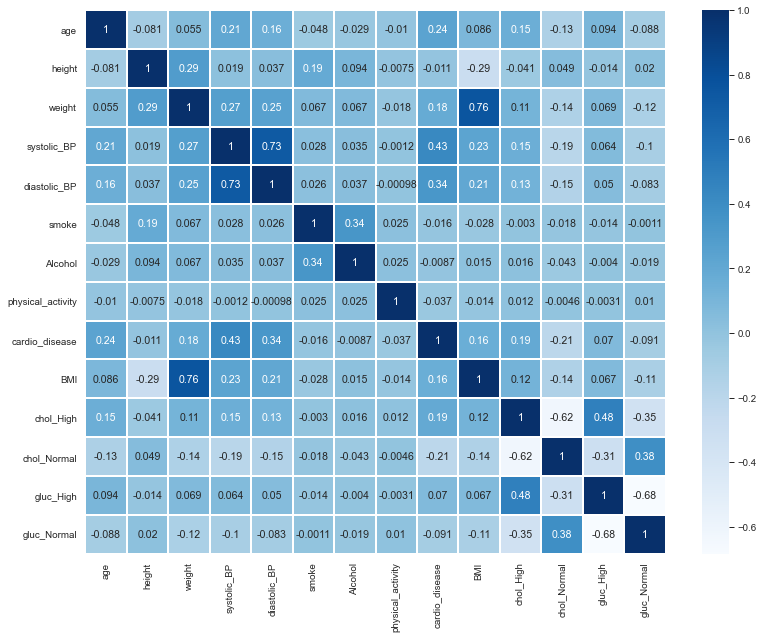

In [91]:
plt.figure(figsize=(13,10))
sns.set_context("paper", font_scale=1.1)

test_df = df.corr()

sns.heatmap(test_df, annot=True, cmap="Blues", linecolor="white", linewidth=1)
#This visualization shows us the correlation of our data

## Regression Plot

<Figure size 720x720 with 0 Axes>

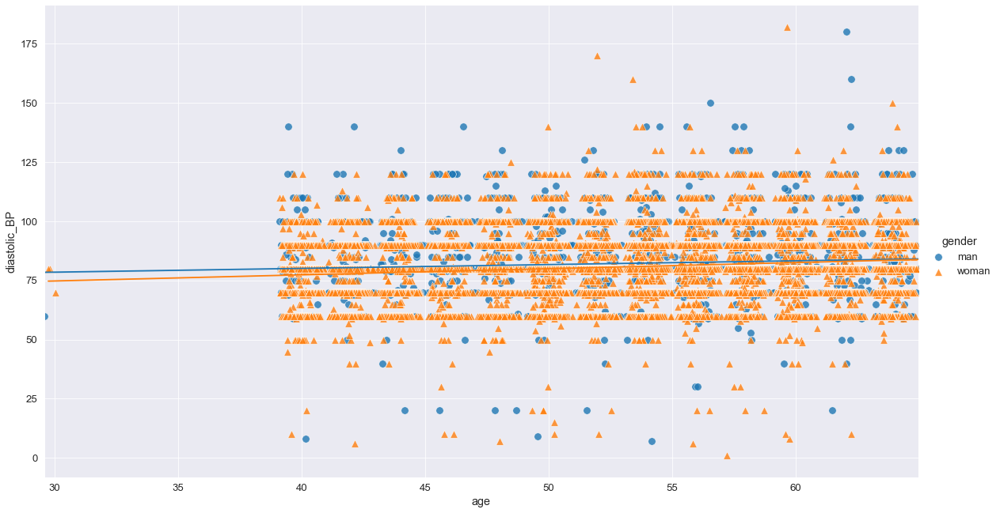

In [92]:
plt.figure(figsize=(10,10))
sns.set_context("paper", font_scale=1.5)
sns.lmplot(x="age", y="diastolic_BP", hue="gender", data=df, markers=['o', '^'], aspect=1.8, height=9,
          scatter_kws={"s": 90, "linewidth": 0.6, "edgecolor": 'w'})

#This visualization shows us that both men and women will have a slight increase in their diastolic BP
#as they age

<Figure size 720x720 with 0 Axes>

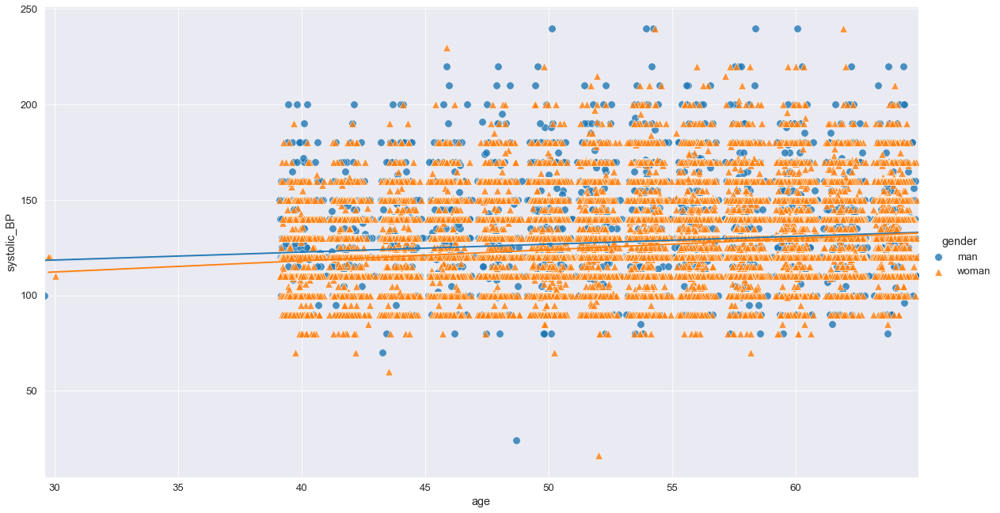

In [93]:
plt.figure(figsize=(10,10))
sns.set_context("paper", font_scale=1.5)
sns.lmplot(x="age", y="systolic_BP", hue="gender", data=df, markers=['o', '^'], aspect=1.8, height=9,
          scatter_kws={"s": 90, "linewidth": 0.6, "edgecolor": 'w'})

#This visualization shows us that both men and women will have a slight increase in their systolic BP
#as they age

<AxesSubplot:xlabel='cardio_disease', ylabel='BMI'>

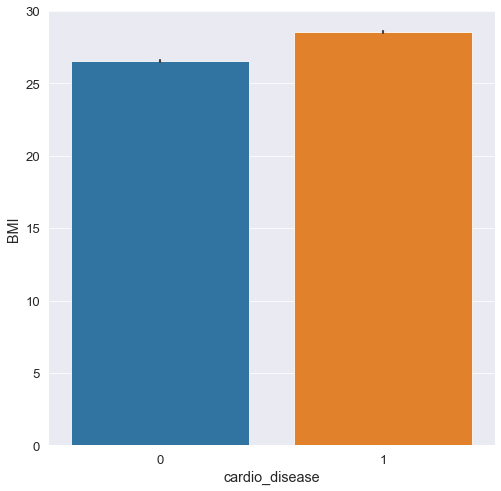

In [94]:
plt.figure(figsize=(8,8))
#this adjusts the size of the entire plot

sns.barplot(x="cardio_disease", y="BMI", data=df)

#This visualization shows that individuals with cardio disease have a slightly higher BMI
#when compared to those without cardio disease

<AxesSubplot:xlabel='cardio_disease', ylabel='weight'>

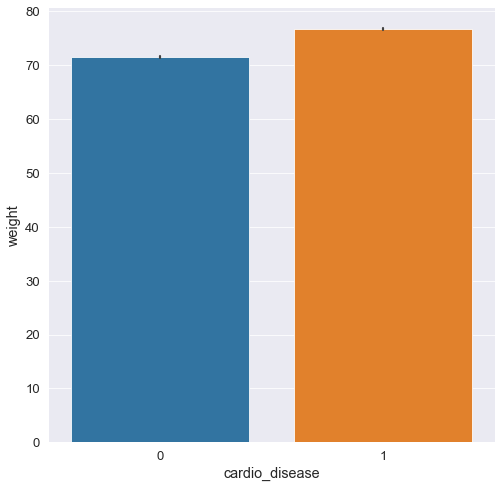

In [95]:
plt.figure(figsize=(8,8))
#this adjusts the size of the entire plot

sns.barplot(x="cardio_disease", y="weight", data=df)